In [2]:
import scanpy as sc
import pandas as pd
# #import squidpy as sq
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
adata = sc.read_h5ad('FGR_batch_corrected_merged_March_2025.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 17539 × 16134
    obs: 'in_tissue', 'array_row', 'array_col', 'Trimester', 'Sample', 'Pathology', 'Sex', 'Gestation', 'Centile', 'Delivery', 'BMI', 'Mat_age', 'Code', 'Batch', 'Batch2', 'Pathology2', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'Gestation2', 'n_genes', 'leiden', 'leiden_1', 'leiden_2', 'leiden_1.5'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Delivery_colors', 'Gestation2_colors', 'Gestation_colors', 'Pathology_colors', 'Sample_colors', 'Sex_colors', 'hvg', 'leiden', 'leiden_1', 'leiden_1.5', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2', 'leiden_2_colors', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_spatial_Control_1', 'X_spat

#### Identify DEGS per "Sample" and "Pathology" ####

In [ ]:
adata.uns['log1p']["base"] = None

In [5]:
sc.tl.rank_genes_groups(adata, 'Sample', method='wilcoxon', key_added = "wilcoxon_clusters")

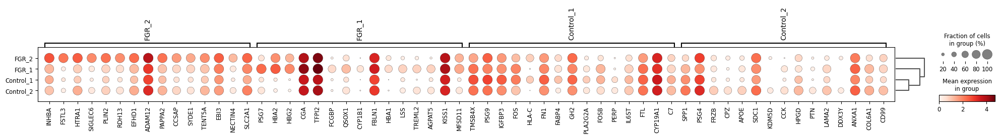

In [6]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=15, key="wilcoxon_clusters", groupby="Sample")

In [7]:
sc.tl.rank_genes_groups(adata, 'Pathology', method='wilcoxon', key_added = "wilcoxon_pathology")

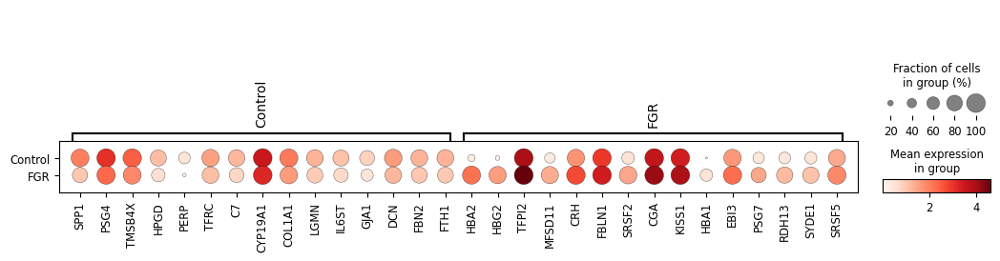

In [8]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=15, key="wilcoxon_pathology", groupby="Pathology")

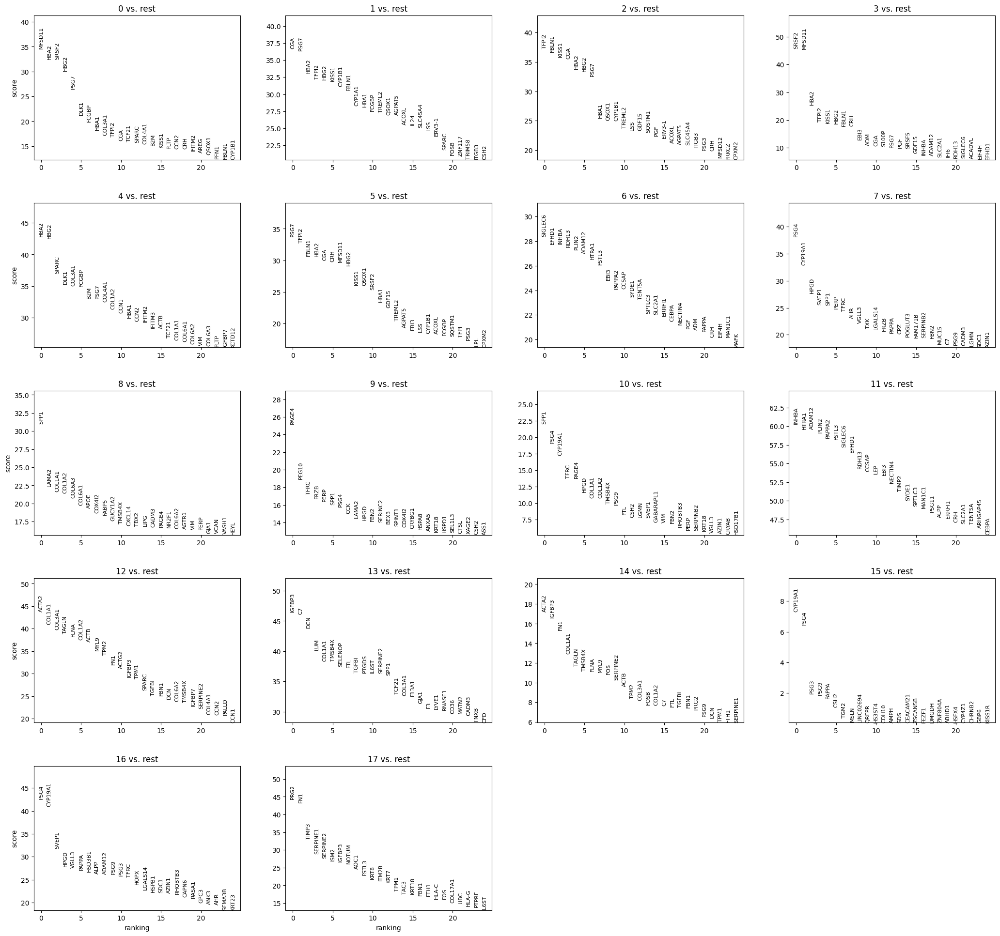

In [9]:
#to determine cells in each cluster
sc.tl.rank_genes_groups(adata, 'leiden_1.5', method='wilcoxon', key_added = "wilcoxon_leiden",)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "wilcoxon_leiden")

In [13]:
result = adata.uns['wilcoxon_leiden']
groups = result['names'].dtype.names
adata_genes= pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals','logfoldchanges']})

adata_genes.head()

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,14_l,15_n,15_p,15_l,16_n,16_p,16_l,17_n,17_p,17_l
0,MFSD11,2.557399e-262,2.140132,CGA,1.572152e-294,0.991855,TFPI2,9.825522e-304,0.936356,SRSF2,...,1.261091,CYP19A1,2.561969e-13,-0.122398,PSG4,0.000000e+00,1.182407,PRG2,0.000000e+00,6.392506
1,HBA2,9.861167e-232,2.429530,PSG7,2.276060e-290,2.852651,FBLN1,7.148265e-295,0.792030,MFSD11,...,1.160835,PSG4,1.415921e-10,0.001309,CYP19A1,0.000000e+00,0.756720,FN1,0.000000e+00,3.269121
2,SRSF2,7.375635e-231,1.758856,HBA2,1.110971e-239,2.580215,KISS1,3.127404e-282,0.953025,HBA2,...,0.979716,PSG3,4.816361e-02,-0.469623,SVEP1,3.465459e-221,0.587556,TIMP3,6.158098e-239,1.591210
3,HBG2,2.958610e-199,2.075998,TFPI2,8.542734e-228,0.831021,CGA,5.392538e-276,0.950764,TFPI2,...,0.808247,PSG9,6.099355e-02,-0.426354,HPGD,9.549822e-171,1.099100,SERPINE1,4.765256e-183,1.540824
4,PSG7,1.538391e-154,1.970876,HBG2,6.075857e-227,2.312342,HBA2,5.582308e-251,2.533645,KISS1,...,1.083156,PAPPA,9.790625e-02,-0.430772,VGLL3,7.270418e-168,0.655866,SERPINE2,7.810623e-168,2.214719


In [14]:
adata_genes.to_csv('spatial3_markergenes_clusters.csv')

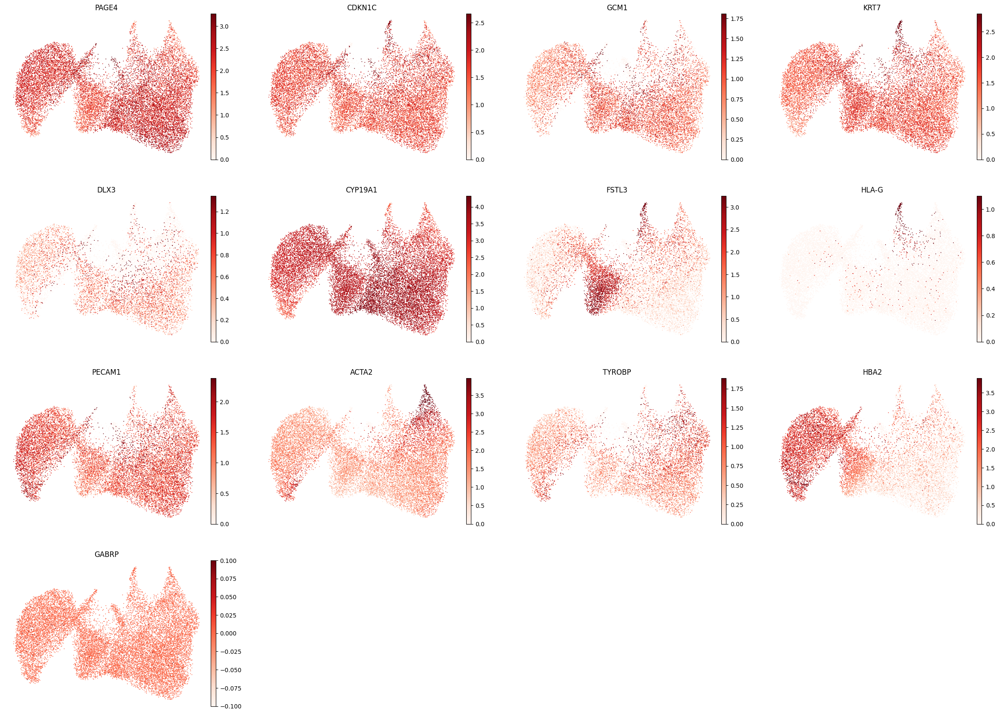

In [25]:
sc.pl.umap(   
    adata,
    color=["PAGE4", # "PEG10" CTB
           "CDH1",
           "MET",
           "CCNB2",
           "NRP2",
           "PARP1",
           "INSL4",
           "CYP19A1", # STB CELLMARKER2.0
           "FSTL3", # EVT HUMAN PROTEIN ATLAS "HLA-G"
           "HLA-G",
           "PECAM1", # END https://www.frontiersin.org/journals/cardiovascular-medicine/articles/10.3389/fcvm.2019.00165/full
           "ACTA2", # SM PANGLAODB
           "TYROBP", # HB HUMAN PROTEIN ATLAS
           "HBA2", # MIC 
           "GABRP"], # FB HUMAN PROTEIN ATLAS
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

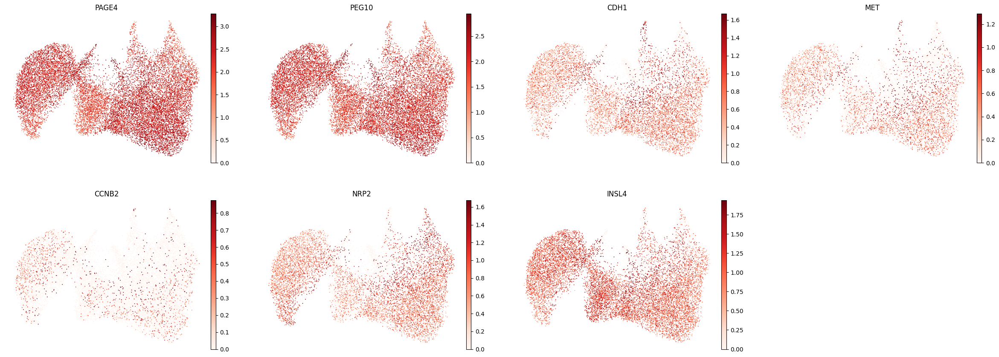

In [29]:
sc.pl.umap(   
    adata,
    color=["PAGE4", # "PEG10" CTB
           "PEG10",
           "CDH1",
           "MET",
           "CCNB2",
           "NRP2",
           "INSL4"],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

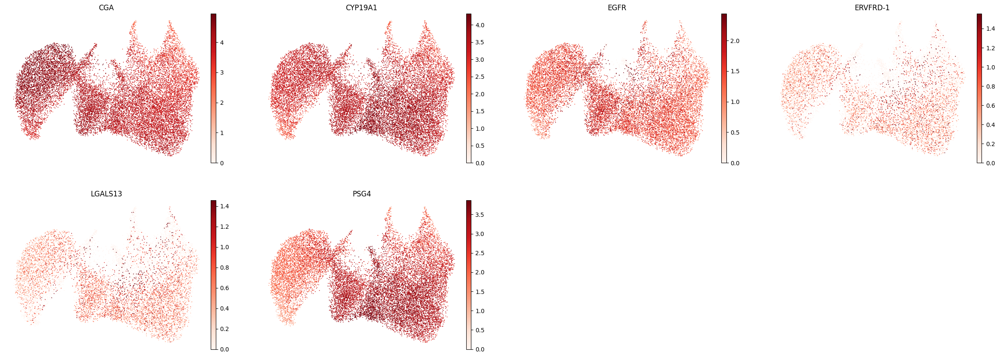

In [32]:
sc.pl.umap(   
    adata,
    color=["CGA", # STB
           "CYP19A1",
           "EGFR",
           "ERVFRD-1",
           "LGALS13",
           "PSG4"], # CAMPBELL
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

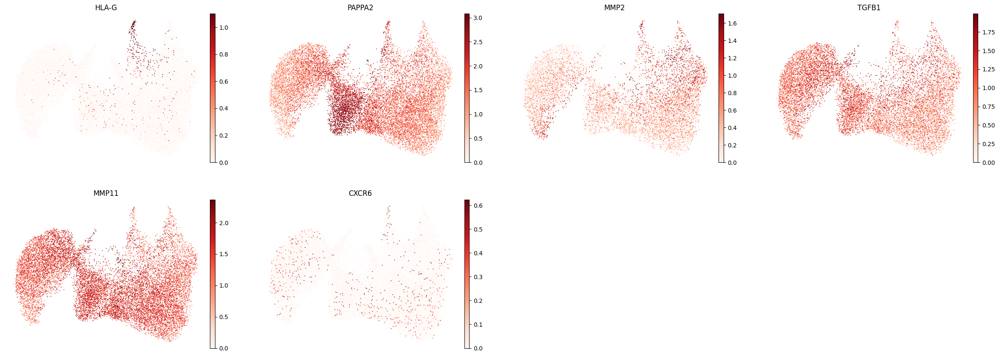

In [31]:
sc.pl.umap(   
    adata,
    color=["HLA-G", # EVT
           "PAPPA2",
           "MMP2",
           "TGFB1",
           "MMP11",
           "CXCR6"],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

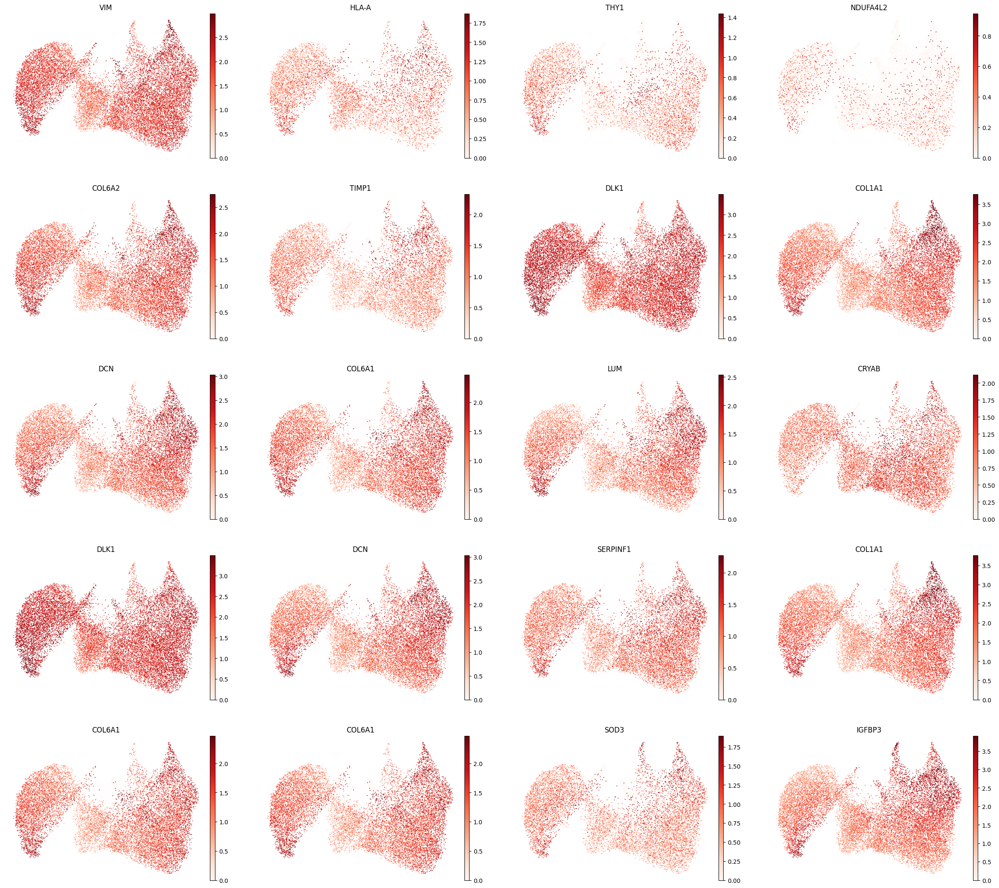

In [35]:
sc.pl.umap(   
    adata,
    color=["VIM","HLA-A","THY1","NDUFA4L2","COL6A2","TIMP1","DLK1","COL1A1","DCN", "COL6A1", "LUM", "CRYAB","DLK1","DCN","SERPINF1","COL1A1","COL6A1", "COL6A1", "SOD3", "IGFBP3"],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)
## general stromal cell markers

In [4]:
# create a dictionary to map cluster to annotation label
celltype = {
     '0': 'Mixed', #y
     '1': 'Mixed', #TB
     '2': 'Mixed', #TB?
     '3': 'Trophoblast', #y
     '4': 'Stromal', #y (FB)
     '5': 'Mixed', #TB
     '6': 'Trophoblast', #y
     '7': 'Mixed', #TB
     '8': 'Stromal', #y
     '9': 'Trophoblast', #y
     '10': 'Mixed', #y?(TB)
     '11': 'Trophoblast', #y
     '12': 'Stromal', #y
     '13': 'Stromal', #y
     '14': 'Stromal', #y
     '15': 'Mixed', #TB
     '16': 'Trophoblast', #y
     '17': 'Mixed' #y
}

# add a new `.obs` column called `cell_type` by mapping clusters to annotation using pandas `map` function
adata.obs['cell_type'] = adata.obs['leiden_1.5'].map(celltype).astype('category')

In [5]:
# create a dictionary to map cluster to annotation label
uniquecelltype = {
     '0': 'Mixed1',
     '1': 'Mixed2',
     '2': 'Mixed3',
     '3': 'Trophoblast1',
     '4': 'Stromal1',
     '5': 'Mixed4',
     '6': 'Trophoblast2',
     '7': 'Mixed5',
     '8': 'Stromal2',
     '9': 'Trophoblast3',
     '10': 'Mixed6',
     '11': 'Trophoblast4',
     '12': 'Stromal3',
     '13': 'Stromal4', 
     '14': 'Stromal5',
     '15': 'Mixed7',
     '16': 'Trophoblast5',
     '17': 'Mixed8'
}

# add a new `.obs` column called `unique_cell_type` by mapping clusters to annotation using pandas `map` function
adata.obs['unique_cell_type'] = adata.obs['leiden_1.5'].map(uniquecelltype).astype('category')

In [38]:
adata.write_h5ad('spatial3_annotated.h5ad')

#### Human protein atlas ####

In [15]:
# Define a function to map genes to cell types; uses Protein Atlas dataset to search for each marker gene and retrieve the top 3 cell types the gene is highly expressed in (based on nTPM values)
def gene_lookup(input_df, search_df):
    '''
    input_df: pandas dataframe with columns of different clusters, and rows containing gene names
    search_df: pandas dataframe containing the 'rna_single_cell_type_tissue.tsv' from human protein atlas (create a subset by tissue type)
    '''
    
    input_clusters = input_df.columns.tolist()
    output = []
    for cluster in input_clusters:  
        for gene in input_df[cluster].tolist():
            try:
                search = search_df[search_df['Gene name'] == gene].nlargest(3,'nTPM')
                output.append([cluster, gene, search['Cell type'].iloc[0],search['nTPM'].iloc[0],search['Cell type'].iloc[1],search['nTPM'].iloc[1],search['Cell type'].iloc[2],search['nTPM'].iloc[2]])
            except IndexError:
                output.append([cluster, gene, 'error', 'error', 'error', 'error', 'error', 'error'])
    return pd.DataFrame(output, columns = ['Cluster_Name', 'Gene_Name', 'Cell_Type_1', 'nTPM_1', 'Cell_Type_2', 'nTPM_2', 'Cell_Type_3', 'nTPM_3'])

In [17]:
# Load the Protein Atlas data
df = pd.read_csv('./rna_single_cell_type_tissue.tsv', sep='\t')
placenta_df = df[df['Tissue'] == 'placenta'].copy() # create a dataframe of genes where the Tissue type is 'placenta'
df = None
placenta_df.head()

,Gene,Gene name,Tissue,Cluster,Cell type,Read count,nTPM
86,ENSG00000000003,TSPAN6,placenta,c-0,cytotrophoblasts,1254.0,25.7
87,ENSG00000000003,TSPAN6,placenta,c-1,smooth muscle cells,857.0,54.3
88,ENSG00000000003,TSPAN6,placenta,c-2,extravillous trophoblasts,1624.0,48.7
89,ENSG00000000003,TSPAN6,placenta,c-3,cytotrophoblasts,882.0,33.3
90,ENSG00000000003,TSPAN6,placenta,c-4,hofbauer cells,33.0,2.7


In [18]:
 # Load the marker gene data into a pandas DataFrame
gene_to_cell_type_annotations = pd.read_csv('./spatial3_markergenes_clusters.csv',index_col=0)
gene_to_cell_type_annotations.head()

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,14_l,15_n,15_p,15_l,16_n,16_p,16_l,17_n,17_p,17_l
0,MFSD11,2.557399e-262,2.140132,CGA,1.572152e-294,0.991855,TFPI2,9.825522e-304,0.936356,SRSF2,...,1.261091,CYP19A1,2.561969e-13,-0.122398,PSG4,0.000000e+00,1.182406,PRG2,0.000000e+00,6.392506
1,HBA2,9.861167e-232,2.429530,PSG7,2.276060e-290,2.852651,FBLN1,7.148265e-295,0.792030,MFSD11,...,1.160835,PSG4,1.415921e-10,0.001309,CYP19A1,0.000000e+00,0.756720,FN1,0.000000e+00,3.269121
2,SRSF2,7.375635e-231,1.758856,HBA2,1.110971e-239,2.580215,KISS1,3.127404e-282,0.953025,HBA2,...,0.979715,PSG3,4.816361e-02,-0.469623,SVEP1,3.465459e-221,0.587556,TIMP3,6.158098e-239,1.591210
3,HBG2,2.958610e-199,2.075998,TFPI2,8.542734e-228,0.831021,CGA,5.392538e-276,0.950764,TFPI2,...,0.808247,PSG9,6.099355e-02,-0.426354,HPGD,9.549822e-171,1.099100,SERPINE1,4.765256e-183,1.540824
4,PSG7,1.538391e-154,1.970876,HBG2,6.075857e-227,2.312342,HBA2,5.582308e-251,2.533645,KISS1,...,1.083156,PAPPA,9.790625e-02,-0.430772,VGLL3,7.270418e-168,0.655866,SERPINE2,7.810623e-168,2.214719


In [19]:
# Keep columns and first 30 genes for annotation
gene_to_cell_type_annotations = gene_to_cell_type_annotations.loc[:,gene_to_cell_type_annotations.columns].head(30).copy() 
gene_to_cell_type_annotations

,0_n,0_p,0_l,1_n,1_p,1_l,2_n,2_p,2_l,3_n,...,14_l,15_n,15_p,15_l,16_n,16_p,16_l,17_n,17_p,17_l
0,MFSD11,2.557399e-262,2.140132,CGA,1.572152e-294,0.991855,TFPI2,9.825522e-304,0.936356,SRSF2,...,1.261091,CYP19A1,2.561969e-13,-0.122398,PSG4,0.000000e+00,1.182406,PRG2,0.000000e+00,6.392506
1,HBA2,9.861167e-232,2.429530,PSG7,2.276060e-290,2.852651,FBLN1,7.148265e-295,0.792030,MFSD11,...,1.160835,PSG4,1.415921e-10,0.001309,CYP19A1,0.000000e+00,0.756720,FN1,0.000000e+00,3.269121
2,SRSF2,7.375635e-231,1.758856,HBA2,1.110971e-239,2.580215,KISS1,3.127404e-282,0.953025,HBA2,...,0.979715,PSG3,4.816361e-02,-0.469623,SVEP1,3.465459e-221,0.587556,TIMP3,6.158098e-239,1.591210
3,HBG2,2.958610e-199,2.075998,TFPI2,8.542734e-228,0.831021,CGA,5.392538e-276,0.950764,TFPI2,...,0.808247,PSG9,6.099355e-02,-0.426354,HPGD,9.549822e-171,1.099100,SERPINE1,4.765256e-183,1.540824
4,PSG7,1.538391e-154,1.970876,HBG2,6.075857e-227,2.312342,HBA2,5.582308e-251,2.533645,KISS1,...,1.083156,PAPPA,9.790625e-02,-0.430772,VGLL3,7.270418e-168,0.655866,SERPINE2,7.810623e-168,2.214719
5,DLK1,2.107205e-100,0.609485,KISS1,1.497678e-223,0.877064,HBG2,4.553561e-244,2.302571,HBG2,...,0.656740,CSH2,2.786578e-01,-0.282913,PAPPA,8.500940e-163,0.701015,ISM2,1.386325e-159,1.915027
6,FCGBP,1.605536e-88,1.687797,CYP1B1,1.339258e-212,2.634408,PSG7,4.599439e-232,2.439024,FBLN1,...,0.809966,TGM2,6.935765e-01,-0.566215,HSD3B1,1.294161e-157,0.579097,IGFBP3,1.537042e-156,1.323957
7,HBA1,1.677610e-74,1.453731,FBLN1,2.191939e-205,0.681095,HBA1,4.845903e-143,1.829834,CRH,...,0.801779,MSLN,8.889231e-01,4.117150,ALPP,2.539116e-152,0.699216,NOTUM,3.047753e-151,3.856457
8,COL3A1,3.555304e-66,0.550629,CYP1A1,2.222605e-176,2.748327,QSOX1,1.000843e-138,1.281754,EBI3,...,0.800209,LINC02694,9.172248e-01,3.041681,ADAM12,7.349417e-151,0.542866,AOC1,8.676399e-135,2.062617
9,TFPI2,6.322723e-64,0.433421,HBA1,8.016433e-175,1.901568,CYP1B1,1.410737e-137,2.315313,ADM,...,1.002335,QRFPR,9.364397e-01,4.864054,PSG9,9.017657e-151,0.785420,FSTL3,1.612609e-115,2.127594


In [20]:
# Maps marker genes to cell types by calling gene_lookup()
results = gene_lookup(gene_to_cell_type_annotations, placenta_df) 
results

,Cluster_Name,Gene_Name,Cell_Type_1,nTPM_1,Cell_Type_2,nTPM_2,Cell_Type_3,nTPM_3
0,0_n,MFSD11,extravillous trophoblasts,96.7,extravillous trophoblasts,95.3,extravillous trophoblasts,72.8
1,0_n,HBA2,error,error,error,error,error,error
2,0_n,SRSF2,error,error,error,error,error,error
3,0_n,HBG2,error,error,error,error,error,error
4,0_n,PSG7,error,error,error,error,error,error
...,...,...,...,...,...,...,...,...
1615,17_l,0.465351,error,error,error,error,error,error
1616,17_l,1.215177,error,error,error,error,error,error
1617,17_l,0.945328,error,error,error,error,error,error
1618,17_l,0.456123,error,error,error,error,error,error


In [21]:
results.to_csv('./spatial3.markergenes_to _cell_type_annotation.csv') # used to manually assess cell type annotation

# OXPHOS heatmap #

In [ ]:
# import scanpy as sc
# import anndata as ad
# import pandas as pd
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# from scipy import stats

In [6]:
mitocarta = pd.read_csv("./MitoCarta_full_transformed.csv")

In [7]:
# Create a dictionary where each gene maps to a list of pathways
gene_to_pathway_dict = mitocarta.groupby('Gene')['MitoPathway'].apply(list).to_dict()

# Add pathway information to the var metadata (now allows multiple pathways per gene)
adata.var['MitoPathways'] = adata.var_names.map(lambda x: gene_to_pathway_dict.get(x.split('.')[0], []))
# Check the result
adata.var[['MitoPathways']].head()

,MitoPathways
SAMD11,[]
NOC2L,[]
KLHL17,[]
PLEKHN1,[]
PERM1,[]


In [8]:
# 1. Define pathway names (matching the labels in MitoPathways)
pathway_names = ["OXPHOS", "OXPHOS_subunits", "OXPHOS_assembly_factors", "Complex_I", "CI_subunits", "CI_assembly_factors", 
                 "Complex_II", "CII_subunits", "CII_assembly_factors",
                 "Complex_III", "CIII_subunits", "CIII_assembly_factors",
                 "Complex_IV", "CIV_subunits", "CIV_assembly_factors",
                 "Complex_V", "CV_subunits", "CV_assembly_factors",
                 "Respirasome_assembly", "Cytochrome_C"]

In [9]:
# 2. Extract genes for each pathway
## create a dictionary where each key is a pathway name and each value is a list of genes associated with that pathway 
## finds genes in adata with the 'MitoPathways' annotation
pathway_genes = {}
for pathway in pathway_names:
    pathway_genes[pathway] = adata.var[adata.var['MitoPathways'].apply(lambda x: pathway in x)].index.tolist()
    print(f"Found {len(pathway_genes[pathway])} genes for {pathway}")

Found 137 genes for OXPHOS
Found 77 genes for OXPHOS_subunits
Found 61 genes for OXPHOS_assembly_factors
Found 53 genes for Complex_I
Found 32 genes for CI_subunits
Found 21 genes for CI_assembly_factors
Found 5 genes for Complex_II
Found 3 genes for CII_subunits
Found 2 genes for CII_assembly_factors
Found 13 genes for Complex_III
Found 7 genes for CIII_subunits
Found 6 genes for CIII_assembly_factors
Found 45 genes for Complex_IV
Found 18 genes for CIV_subunits
Found 27 genes for CIV_assembly_factors
Found 20 genes for Complex_V
Found 15 genes for CV_subunits
Found 5 genes for CV_assembly_factors
Found 2 genes for Respirasome_assembly
Found 2 genes for Cytochrome_C


In [53]:
adata.obs

,in_tissue,array_row,array_col,Trimester,Sample,Pathology,Sex,Gestation,Centile,Delivery,...,total_counts,log1p_total_counts,Gestation2,n_genes,leiden,leiden_1,leiden_2,leiden_1.5,cell_type,unique_cell_type
AAACAAGTATCTCCCA-1-0,1,50,102,Third,FGR_1,FGR,Female,263,0.6,C/S,...,7129.0,8.872066,1,3619,0,0,0,0,Mixed,Mixed1
AAACAATCTACTAGCA-1-0,1,3,43,Third,FGR_1,FGR,Female,263,0.6,C/S,...,18218.0,9.810221,1,5825,3,3,4,2,Mixed,Mixed3
AAACACCAATAACTGC-1-0,1,59,19,Third,FGR_1,FGR,Female,263,0.6,C/S,...,7566.0,8.931552,1,3837,1,1,0,4,Stromal,Stromal1
AAACAGAGCGACTCCT-1-0,1,14,94,Third,FGR_1,FGR,Female,263,0.6,C/S,...,22359.0,10.015029,1,6410,2,2,6,1,Mixed,Mixed2
AAACAGCTTTCAGAAG-1-0,1,43,9,Third,FGR_1,FGR,Female,263,0.6,C/S,...,16911.0,9.735779,1,5718,2,2,6,1,Mixed,Mixed2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1-3,1,58,42,Third,Control_2,Control,Female,277,99,C/S,...,11274.0,9.330343,2,4767,10,10,20,9,Trophoblast,Trophoblast3
TTGTTTCATTAGTCTA-1-3,1,60,30,Third,Control_2,Control,Female,277,99,C/S,...,12692.0,9.448806,2,5085,11,11,21,9,Trophoblast,Trophoblast3
TTGTTTCCATACAACT-1-3,1,45,27,Third,Control_2,Control,Female,277,99,C/S,...,7221.0,8.884888,2,3615,11,11,18,8,Stromal,Stromal2
TTGTTTGTATTACACG-1-3,1,73,41,Third,Control_2,Control,Female,277,99,C/S,...,4273.0,8.360306,2,2508,11,11,21,9,Trophoblast,Trophoblast3


In [88]:
adata_FGR = adata[adata.obs['Pathology'] == 'FGR'].copy()

In [89]:
# 3. Calculate the average expression per pathway per unique cell type
## extract list of unique_cell_types
unique_cell_types = adata_FGR.obs['unique_cell_type'].cat.categories.tolist()
## create empty df where rows are pathways and columns are cell types to store average expression scores 
pathway_scores = pd.DataFrame(index=pathway_names, columns=unique_cell_types)

In [90]:
# loop through each pathway and its genes; prints warning if no genes found for a pathway
for pathway, genes in pathway_genes.items():
    if not genes:
        print(f"Warning: No genes found for pathway {pathway}")
        continue
        
    # create boolean mask for each cell type, then calculate mean expression of all pathway genes across the cells
    ## stored in pathway_scores df; converted to float 
    for cell_type in unique_cell_types:
        cells_mask = adata_FGR.obs['unique_cell_type'] == cell_type
        pathway_expr = adata_FGR[cells_mask, genes].X.mean(axis=0)
          # Convert to a numeric value explicitly
        pathway_scores.loc[pathway, cell_type] = float(np.mean(pathway_expr))

# Convert the DataFrame to numeric values
pathway_scores = pathway_scores.astype(float)

In [91]:
# 4. calculate Z-score 
## subtract pathway_scores by mean, and divide by standard deviation
## standardises data so each pathway has mean=0 and SD=1
means = pathway_scores.mean(axis=1)
stds = pathway_scores.std(axis=1)
pathway_scores_zscore = pathway_scores.subtract(means, axis=0).divide(stds, axis=0)

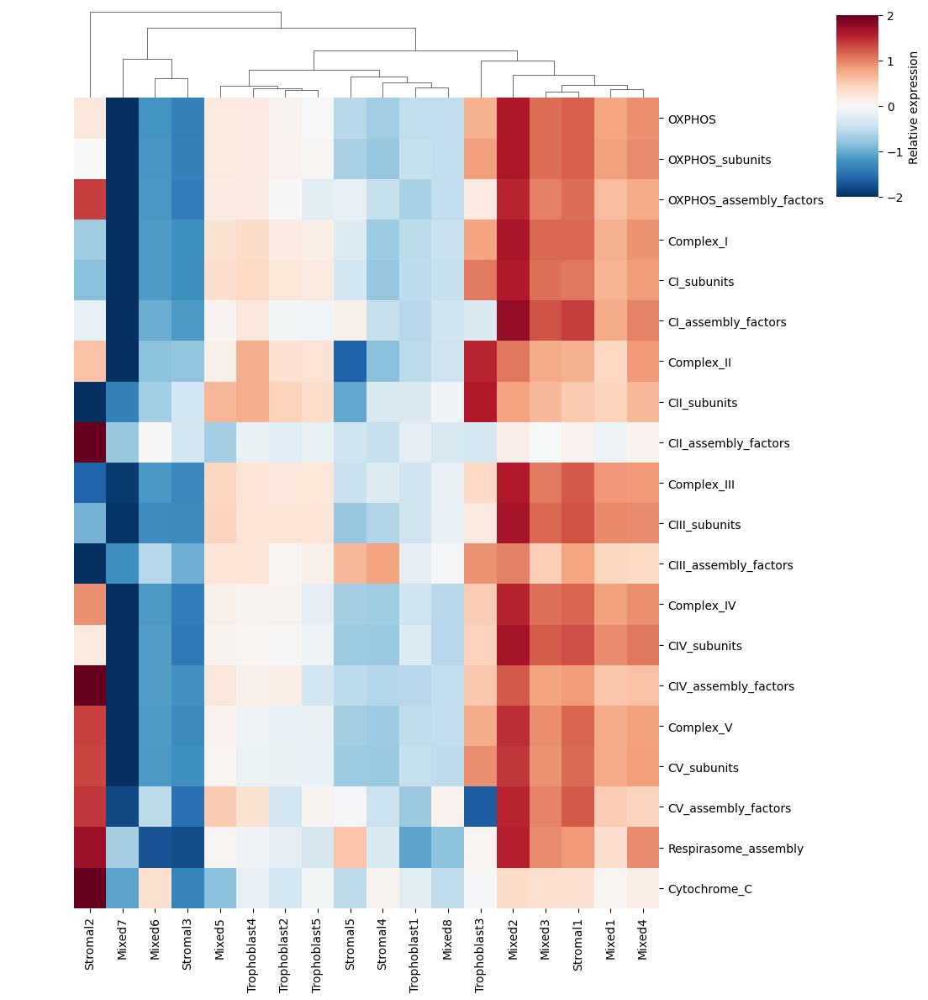

In [92]:
# Creating the heatmap with clustering only on cell types (columns)
ax = sns.clustermap(pathway_scores_zscore, 
                   cmap='RdBu_r',
                   center=0,
                   vmin=-2, vmax=2,
                   figsize=(10, 12),
                   cbar_kws={'label': 'Relative expression'},
                    cbar_pos=(1, .8, .05, .18),
                   dendrogram_ratio=0.1,
                   row_cluster=False,    # Don't cluster rows (pathways)
                   col_cluster=True)     # Cluster columns (cell types)

In [93]:
adata_control = adata[adata.obs['Pathology'] == 'Control'].copy()

In [94]:
# 3. Calculate the average expression per pathway per unique cell type
## extract list of unique_cell_types
unique_cell_types = adata_control.obs['unique_cell_type'].cat.categories.tolist()
## create empty df where rows are pathways and columns are cell types to store average expression scores 
pathway_scores = pd.DataFrame(index=pathway_names, columns=unique_cell_types)

In [95]:
# loop through each pathway and its genes; prints warning if no genes found for a pathway
for pathway, genes in pathway_genes.items():
    if not genes:
        print(f"Warning: No genes found for pathway {pathway}")
        continue
        
    # create boolean mask for each cell type, then calculate mean expression of all pathway genes across the cells
    ## stored in pathway_scores df; converted to float 
    for cell_type in unique_cell_types:
        cells_mask = adata_control.obs['unique_cell_type'] == cell_type
        pathway_expr = adata_control[cells_mask, genes].X.mean(axis=0)
          # Convert to a numeric value explicitly
        pathway_scores.loc[pathway, cell_type] = float(np.mean(pathway_expr))

# Convert the DataFrame to numeric values
pathway_scores = pathway_scores.astype(float)

In [96]:
# 4. calculate Z-score 
## subtract pathway_scores by mean, and divide by standard deviation
## standardises data so each pathway has mean=0 and SD=1
means = pathway_scores.mean(axis=1)
stds = pathway_scores.std(axis=1)
pathway_scores_zscore = pathway_scores.subtract(means, axis=0).divide(stds, axis=0)

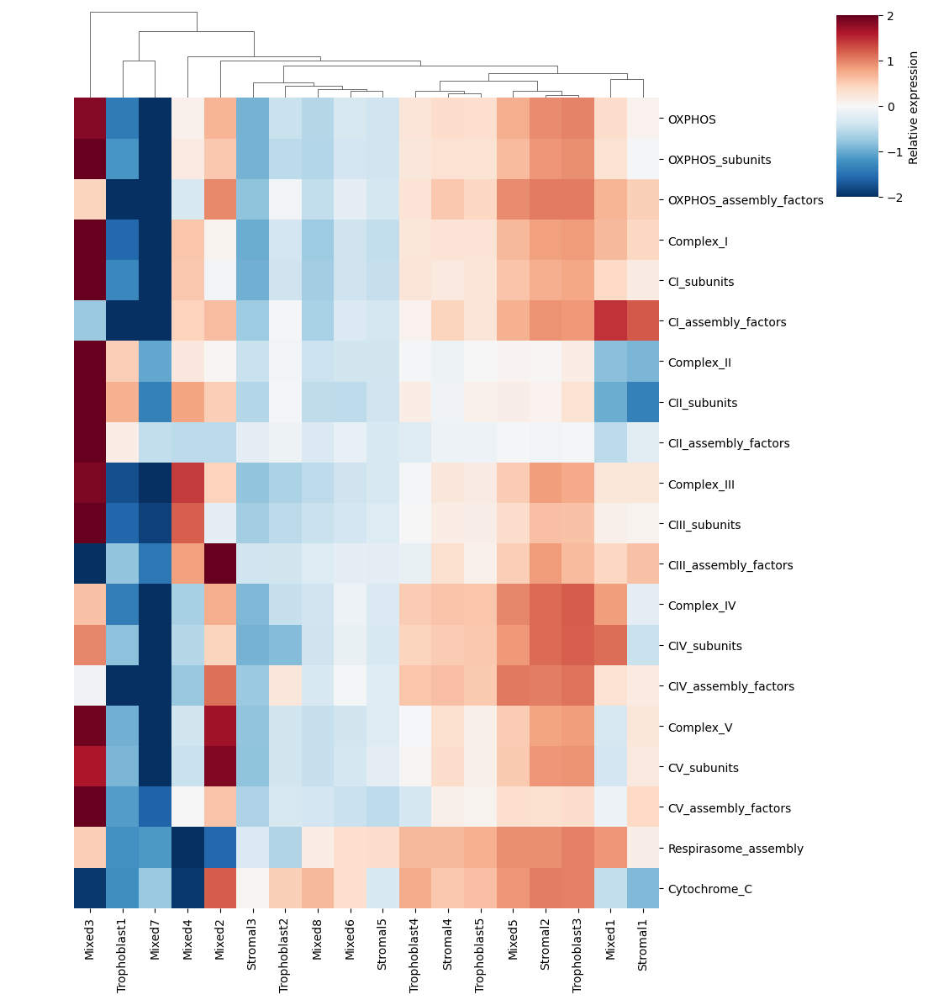

In [97]:
# Creating the heatmap with clustering only on cell types (columns)
ax = sns.clustermap(pathway_scores_zscore, 
                   cmap='RdBu_r',
                   center=0,
                   vmin=-2, vmax=2,
                   figsize=(10, 12),
                   cbar_kws={'label': 'Relative expression'},
                    cbar_pos=(1, .8, .05, .18),
                   dendrogram_ratio=0.1,
                   row_cluster=False,    # Don't cluster rows (pathways)
                   col_cluster=True)     # Cluster columns (cell types)

In [1]:
adata_FGR = adata[adata.obs['Pathology'] == 'FGR'].copy()
adata_Control = adata[adata.obs['Pathology'] == 'Control'].copy()

unique_cell_types = adata.obs['unique_cell_type'].cat.categories.tolist()

columns = [f"{ct}_FGR" for ct in unique_cell_types] + [f"{ct}_Control" for ct in unique_cell_types]
pathway_scores = pd.DataFrame(index=pathway_genes.keys(), columns=columns)

for condition, ad in zip(['FGR', 'Control'], [adata_FGR, adata_Control]):
    for cell_type in unique_cell_types:
        cells_mask = ad.obs['unique_cell_type'] == cell_type
        for pathway, genes in pathway_genes.items():
            if not genes:
                print(f"Warning: No genes found for pathway {pathway}")
                continue
            # Filter only genes present in adata
            genes_present = [g for g in genes if g in ad.var_names]
            if not genes_present:
                print(f"Warning: No valid genes found in adata for pathway {pathway}")
                continue
            # Get expression
            expr = ad[cells_mask, genes_present].X
            mean_expr = np.mean(expr)  # average across all genes and cells
            col_name = f"{cell_type}_{condition}"
            pathway_scores.loc[pathway, col_name] = float(mean_expr)

pathway_scores = pathway_scores.astype(float)
pathway_scores.dropna(inplace=True)

# Interleaved order: Trophoblast1_FGR, Trophoblast1_Control, ...
base_order = [
    'Trophoblast1', 'Trophoblast2', 'Trophoblast3', 'Trophoblast4', 'Trophoblast5',
    'Stromal1', 'Stromal2', 'Stromal3', 'Stromal4', 'Stromal5',
    'Mixed1', 'Mixed2', 'Mixed3', 'Mixed4', 'Mixed5', 'Mixed6', 'Mixed7', 'Mixed8'
]

# Interleave FGR and Control
ordered_columns = [f"{ct}_{cond}" for ct in base_order for cond in ['FGR', 'Control']]

pathway_scores_zscore = pathway_scores.subtract(pathway_scores.mean(axis=1), axis=0)
pathway_scores_zscore = pathway_scores_zscore.divide(pathway_scores.std(axis=1), axis=0)
pathway_scores_zscore = pathway_scores_zscore[ordered_columns]

NameError: name 'adata' is not defined

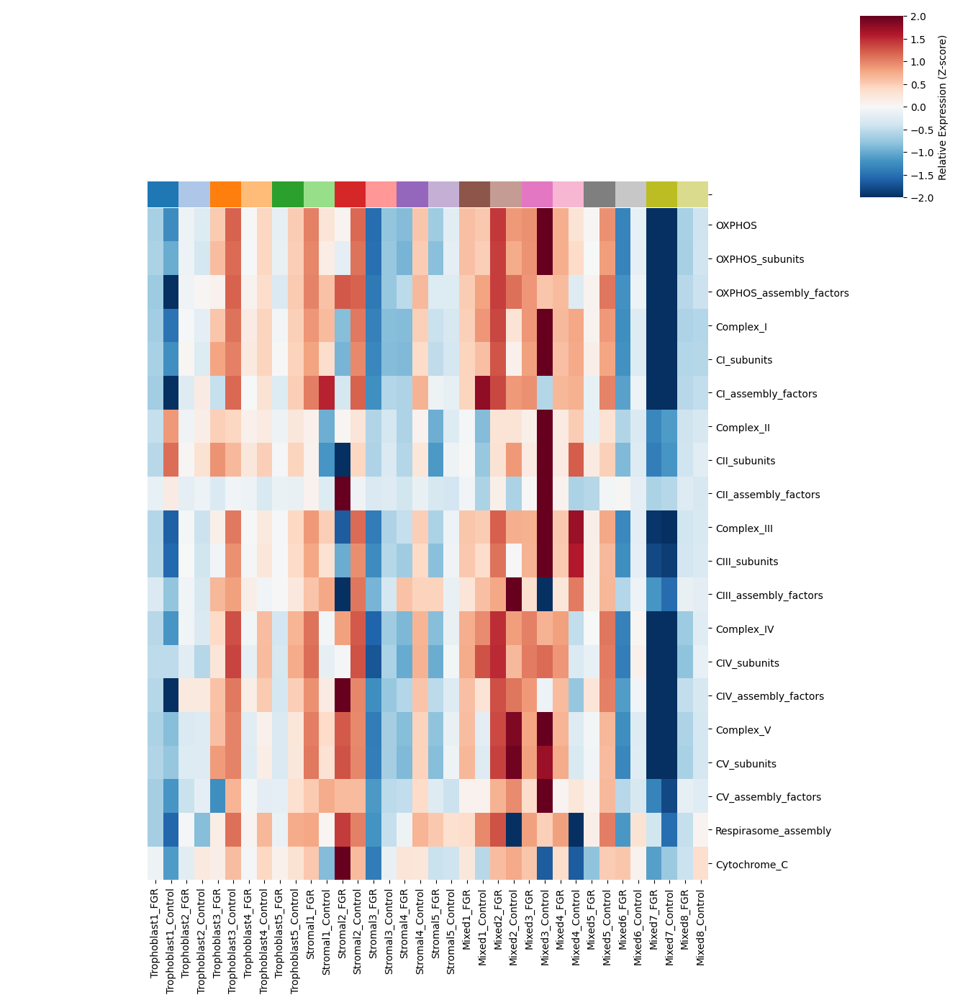

In [109]:
# Define color mapping for the conditions
condition_colors = {
    'FGR': '#d62728',     # red
    'Control': '#1f77b4'  # blue
}

# Create a Series for column conditions
column_conditions = pd.Series(
    ['FGR' if 'FGR' in col else 'Control' for col in pathway_scores_zscore.columns],
    index=pathway_scores_zscore.columns
)

# Create a palette mapping each unique_cell_type to a color
cell_type_palette = sns.color_palette("tab20", n_colors=len(base_order))
cell_type_colors = dict(zip(base_order, cell_type_palette))

# Map each column (e.g. Trophoblast1_FGR) to its cell type color
col_colors = pd.Series(
    [col.split('_')[0] for col in ordered_columns],  # extract cell type from 'Trophoblast1_FGR'
    index=ordered_columns
).map(cell_type_colors)

# Plot with column color bar
sns.clustermap(pathway_scores_zscore,
               cmap='RdBu_r',
               center=0,
               vmin=-2, vmax=2,
               figsize=(12, 14),
               cbar_kws={'label': 'Relative Expression (Z-score)'},
               cbar_pos=(1, .8, .05, .18),
               row_cluster=False,
               col_cluster=False,
               col_colors=col_colors)

plt.show()


In [110]:
adata = adata[adata.obs['cell_type'].isin(['Trophoblast'])].copy()

In [112]:
adata_FGR = adata[adata.obs['Pathology'] == 'FGR'].copy()
adata_Control = adata[adata.obs['Pathology'] == 'Control'].copy()

unique_cell_types = adata.obs['unique_cell_type'].cat.categories.tolist()

columns = [f"{ct}_FGR" for ct in unique_cell_types] + [f"{ct}_Control" for ct in unique_cell_types]
pathway_scores = pd.DataFrame(index=pathway_genes.keys(), columns=columns)

for condition, ad in zip(['FGR', 'Control'], [adata_FGR, adata_Control]):
    for cell_type in unique_cell_types:
        cells_mask = ad.obs['unique_cell_type'] == cell_type
        for pathway, genes in pathway_genes.items():
            if not genes:
                print(f"Warning: No genes found for pathway {pathway}")
                continue
            # Filter only genes present in adata
            genes_present = [g for g in genes if g in ad.var_names]
            if not genes_present:
                print(f"Warning: No valid genes found in adata for pathway {pathway}")
                continue
            # Get expression
            expr = ad[cells_mask, genes_present].X
            mean_expr = np.mean(expr)  # average across all genes and cells
            col_name = f"{cell_type}_{condition}"
            pathway_scores.loc[pathway, col_name] = float(mean_expr)

pathway_scores = pathway_scores.astype(float)
pathway_scores.dropna(inplace=True)

# Interleaved order: Trophoblast1_FGR, Trophoblast1_Control, ...
base_order = [
    'Trophoblast1', 'Trophoblast2', 'Trophoblast3', 'Trophoblast4', 'Trophoblast5'
]

# Interleave FGR and Control
ordered_columns = [f"{ct}_{cond}" for ct in base_order for cond in ['FGR', 'Control']]

pathway_scores_zscore = pathway_scores.subtract(pathway_scores.mean(axis=1), axis=0)
pathway_scores_zscore = pathway_scores_zscore.divide(pathway_scores.std(axis=1), axis=0)
pathway_scores_zscore = pathway_scores_zscore[ordered_columns]

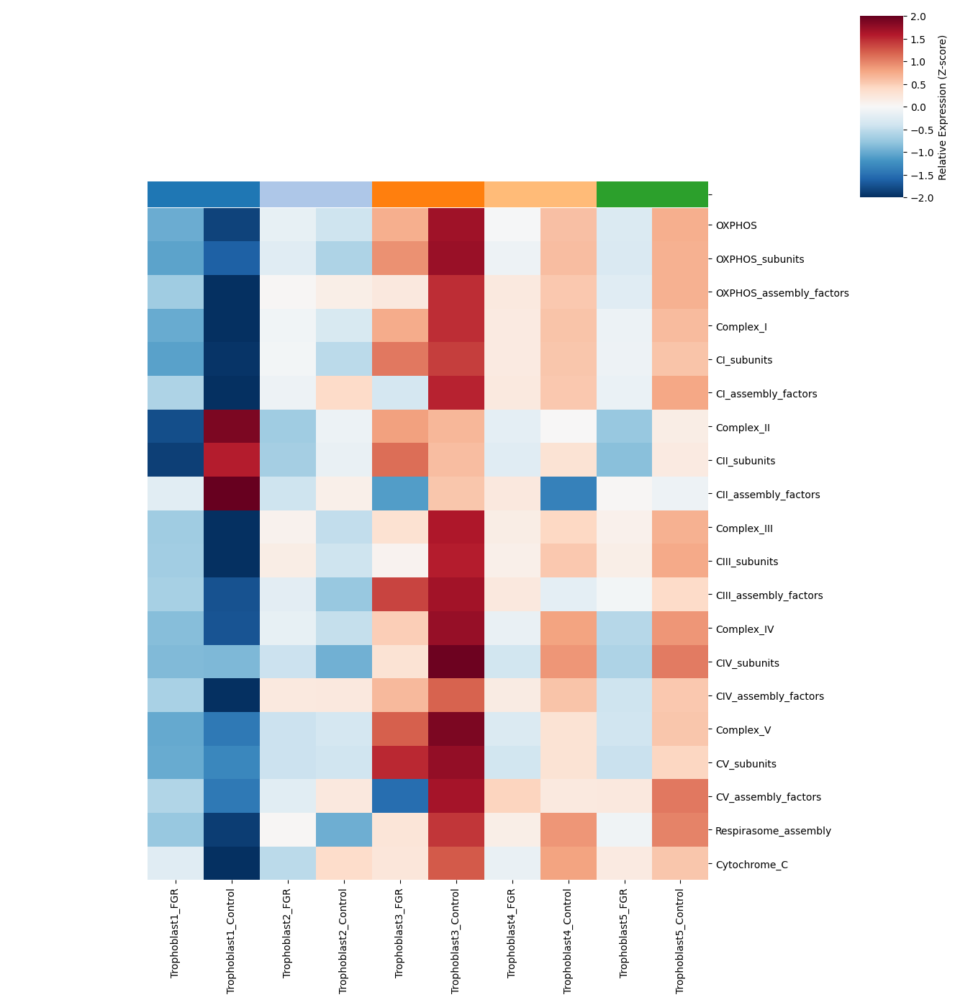

In [115]:
# Define color mapping for the conditions
condition_colors = {
    'FGR': '#d62728',     # red
    'Control': '#1f77b4'  # blue
}

# Create a Series for column conditions
column_conditions = pd.Series(
    ['FGR' if 'FGR' in col else 'Control' for col in pathway_scores_zscore.columns],
    index=pathway_scores_zscore.columns
)

# Create a palette mapping each unique_cell_type to a color
cell_type_palette = sns.color_palette("tab20", n_colors=len(base_order))
cell_type_colors = dict(zip(base_order, cell_type_palette))

# Map each column (e.g. Trophoblast1_FGR) to its cell type color
col_colors = pd.Series(
    [col.split('_')[0] for col in ordered_columns],  # extract cell type from 'Trophoblast1_FGR'
    index=ordered_columns
).map(cell_type_colors)

# Plot with column color bar
sns.clustermap(pathway_scores_zscore,
               cmap='RdBu_r',
               center=0,
               vmin=-2, vmax=2,
               figsize=(12, 14),
               cbar_kws={'label': 'Relative Expression (Z-score)'},
               cbar_pos=(1, .8, .05, .18),
               row_cluster=False,
               col_cluster=False,
               col_colors=col_colors)

plt.show()